In [1]:
using JLD
using DataFrames
using PyPlot
plt = PyPlot

INFO: Precompiling module DataFrames.
INFO: Precompiling module PyPlot.


PyPlot

In [2]:
aes_sbox = [
0x63, 0x7c, 0x77, 0x7b, 0xf2, 0x6b, 0x6f, 0xc5, 0x30, 0x01, 0x67, 0x2b, 0xfe, 0xd7, 0xab, 0x76,
0xca, 0x82, 0xc9, 0x7d, 0xfa, 0x59, 0x47, 0xf0, 0xad, 0xd4, 0xa2, 0xaf, 0x9c, 0xa4, 0x72, 0xc0,
0xb7, 0xfd, 0x93, 0x26, 0x36, 0x3f, 0xf7, 0xcc, 0x34, 0xa5, 0xe5, 0xf1, 0x71, 0xd8, 0x31, 0x15,
0x04, 0xc7, 0x23, 0xc3, 0x18, 0x96, 0x05, 0x9a, 0x07, 0x12, 0x80, 0xe2, 0xeb, 0x27, 0xb2, 0x75,
0x09, 0x83, 0x2c, 0x1a, 0x1b, 0x6e, 0x5a, 0xa0, 0x52, 0x3b, 0xd6, 0xb3, 0x29, 0xe3, 0x2f, 0x84,
0x53, 0xd1, 0x00, 0xed, 0x20, 0xfc, 0xb1, 0x5b, 0x6a, 0xcb, 0xbe, 0x39, 0x4a, 0x4c, 0x58, 0xcf,
0xd0, 0xef, 0xaa, 0xfb, 0x43, 0x4d, 0x33, 0x85, 0x45, 0xf9, 0x02, 0x7f, 0x50, 0x3c, 0x9f, 0xa8,
0x51, 0xa3, 0x40, 0x8f, 0x92, 0x9d, 0x38, 0xf5, 0xbc, 0xb6, 0xda, 0x21, 0x10, 0xff, 0xf3, 0xd2,
0xcd, 0x0c, 0x13, 0xec, 0x5f, 0x97, 0x44, 0x17, 0xc4, 0xa7, 0x7e, 0x3d, 0x64, 0x5d, 0x19, 0x73,
0x60, 0x81, 0x4f, 0xdc, 0x22, 0x2a, 0x90, 0x88, 0x46, 0xee, 0xb8, 0x14, 0xde, 0x5e, 0x0b, 0xdb,
0xe0, 0x32, 0x3a, 0x0a, 0x49, 0x06, 0x24, 0x5c, 0xc2, 0xd3, 0xac, 0x62, 0x91, 0x95, 0xe4, 0x79,
0xe7, 0xc8, 0x37, 0x6d, 0x8d, 0xd5, 0x4e, 0xa9, 0x6c, 0x56, 0xf4, 0xea, 0x65, 0x7a, 0xae, 0x08,
0xba, 0x78, 0x25, 0x2e, 0x1c, 0xa6, 0xb4, 0xc6, 0xe8, 0xdd, 0x74, 0x1f, 0x4b, 0xbd, 0x8b, 0x8a,
0x70, 0x3e, 0xb5, 0x66, 0x48, 0x03, 0xf6, 0x0e, 0x61, 0x35, 0x57, 0xb9, 0x86, 0xc1, 0x1d, 0x9e,
0xe1, 0xf8, 0x98, 0x11, 0x69, 0xd9, 0x8e, 0x94, 0x9b, 0x1e, 0x87, 0xe9, 0xce, 0x55, 0x28, 0xdf,
0x8c, 0xa1, 0x89, 0x0d, 0xbf, 0xe6, 0x42, 0x68, 0x41, 0x99, 0x2d, 0x0f, 0xb0, 0x54, 0xbb, 0x16
];

In [6]:
aes_first_round = readtable("../zypher.jl/sample_traces/AES_trace_firstround_micro.csv");
traces = Array(aes_first_round[:,3:end])


998×9600 Array{Float64,2}:
 0.18302  0.17451  0.18563  0.18311  …  0.18212  0.17367  0.18482  0.18264
 0.18318  0.17644  0.1853   0.18314     0.182    0.17546  0.1847   0.1826 
 0.18358  0.17254  0.18534  0.18291     0.18234  0.17372  0.18501  0.1829 
 0.1831   0.17667  0.18535  0.18312     0.18275  0.17378  0.18491  0.18258
 0.18302  0.17693  0.18547  0.18298     0.18222  0.17143  0.18475  0.18272
 0.18305  0.1745   0.18535  0.18316  …  0.18196  0.17348  0.18476  0.18264
 0.18266  0.17618  0.18499  0.18294     0.18219  0.17348  0.18462  0.18262
 0.18277  0.17238  0.18507  0.18315     0.18227  0.17572  0.1848   0.18283
 0.18274  0.17232  0.18504  0.18295     0.18202  0.17184  0.18486  0.18286
 0.18314  0.17468  0.18551  0.18322     0.18243  0.17398  0.18518  0.1829 
 0.18297  0.17441  0.18516  0.18306  …  0.18234  0.17391  0.18491  0.18273
 0.18298  0.17852  0.18525  0.18302     0.18223  0.17152  0.18494  0.18267
 0.18317  0.17449  0.18525  0.18321     0.18215  0.17357  0.18486  0.1827

In [7]:
n_sample = length(aes_first_round[1]);
n_time = length(traces[1,:]);

In [15]:
attack_round = "first"
target_bit = 3
unit_size = 8
num_unit = 16
plaintexts = aes_first_round[1]
ciphertexts = aes_first_round[2]
res_dir = "path_result_directory"
unit_in_pt = div(length(plaintexts[1]),num_unit)
keymax = 2^unit_size-1
sbox = aes_sbox;

In [16]:
#trying dpa on the first byte of the first round selecting the targetbit as 2
diff_mean_vecs = []
for subkey in 0:255
    marked = zeros(Int,n_sample)
    for i in 1:length(plaintexts)
        p = plaintexts[i]
        pbyte = parse(Int,p[1:2],16)
        xor_val = pbyte$subkey
        sval = sbox[xor_val+1]
        
        if bin(sval,8)[target_bit] == '1'
            marked[i] = 1
        end
    end
    diff_mean = mean(traces[find(marked .== 1),:],1)' - mean(traces[find(marked .== 0),:],1)'
    push!(diff_mean_vecs,diff_mean)
end

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] $ at ./deprecated.jl:376 [inlined]
 [3] macro expansion at ./In[16]:8 [inlined]
 [4] anonymous at ./<missing>:?
 [5] include_string(::String, ::String) at ./loading.jl:515
 [6] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /home/hesl/.julia/v0.6/IJulia/src/execute_request.jl:156
 [7] eventloop(::ZMQ.Socket) at /home/hesl/.julia/v0.6/IJulia/src/eventloop.jl:8
 [8] (::IJulia.##9#12)() at ./task.jl:335
while loading In[16], in expression starting on line 3


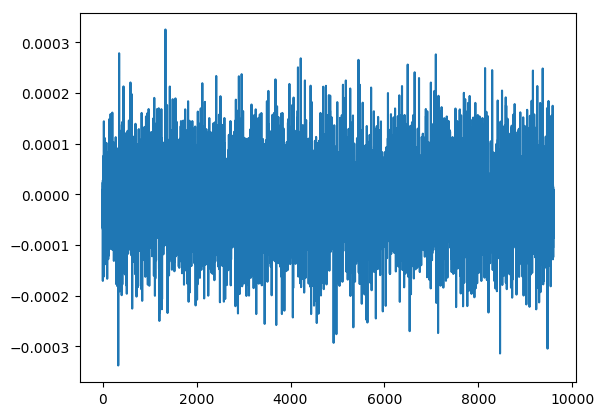

1-element Array{Any,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7f26682ea048>

In [17]:
plt.plot(diff_mean_vecs[1])

In [5]:
type dpaResults
  diff_of_means::Array
  res_dir::String
end

In [ ]:
attack_round = "first"
target_bit = 1
unit_size = 8
num_unit = 16
plaintexts = aes_first_round[1]
ciphertexts = aes_first_round[2]
res_dir = "path_result_directory"
unit_in_pt = div(length(plaintexts[1]),num_unit)
keymax = 2^unit_size-1
sbox = aes_sbox
diff_vecs_units = []
test1 = []
test
  if attack_round == "first"
    @time for i in 1:num_unit
      diff_vecs = Array{Float64}[]
      for subkey in 0:keymax
         marker = zeros(Int,n_sample)
         for p in 1:n_sample
           pt = plaintexts[p]
           ptval = parse(Int, pt[(i-1)*unit_in_pt+1:i*unit_in_pt], 16)
           xor_val = ptval$subkey
           sval = sbox[xor_val+1]
           if bin(sval,unit_size)[target_bit] == '1'
             marker[i] = 1
           end
         end
         #grouping the traces together depending upon
         #which class they belong to 'one' or 'zero'
         diff = mean(traces[find(marker .== 1),:],1)' - mean(traces[find(marker .== 0),:],1)'
         push!(diff_vecs,diff)
            if i==1
                println(traces[find(marker .== 1),:])
                println(traces[find(marker .== 0),:])
            end
       end
       push!(diff_vecs_units,diff_vecs)
     end
   end

x = dpaResults(diff_vecs_units,res_dir);

[0.18302 0.17451 0.18563 0.18311 0.17525 0.18313 0.18354 0.17645 0.18362 0.18321 0.17746 0.18249 0.17451 0.18495 0.18309 0.17427 0.18398 0.18291 0.17516 0.1833 0.18318 0.17344 0.18265 0.18297 0.1742 0.18302 0.17257 0.18468 0.18339 0.17462 0.18484 0.18301 0.17494 0.18284 0.18303 0.17769 0.18261 0.1829 0.18032 0.18294 0.17626 0.18305 0.18302 0.17425 0.18425 0.18279 0.17552 0.18352 0.18323 0.17532 0.18266 0.1833 0.17512 0.18371 0.17506 0.1827 0.1829 0.17251 0.18439 0.18307 0.17545 0.18402 0.18323 0.17572 0.18289 0.18308 0.17857 0.18302 0.17848 0.18552 0.18326 0.17458 0.1841 0.18267 0.17544 0.18376 0.18333 0.17533 0.18232 0.18325 0.17476 0.18351 0.17631 0.18234 0.18243 0.17215 0.18509 0.18307 0.17285 0.18279 0.18292 0.17786 0.1827 0.18296 0.17768 0.18241 0.17968 0.18295 0.18288 0.17649 0.18457 0.18291 0.17726 0.1841 0.18325 0.1754 0.18261 0.18302 0.17614 0.18251 0.17783 0.18046 0.18284 0.17256 0.18394 0.18286 0.17259 0.18303 0.18301 0.17609 0.18296 0.18305 0.17581 0.18244 0.17826 0.18173 0

Excessive output truncated after 524289 bytes.

0.18218 0.18272 0.17805 0.18281 0.17443 0.18334 0.18202 0.17158 0.18384 0.18274 0.17228 0.18224 0.18259 0.17386 0.18273 0.18286 0.17342 0.18237 0.1739 0.18414 0.18262 0.17213 0.18314 0.18242 0.17266 0.18288 0.18256 0.17502 0.18178 0.18281 0.17842 0.18318 0.17426 0.18361 0.18208 0.17388 0.18344 0.18262 0.1747 0.18249 0.1829 0.17634 0.1829 0.18285 0.17421 0.18302 0.1723 0.18496 0.183 0.17207 0.18397 0.18278 0.1729 0.18279 0.18273 0.17758 0.18304 0.1836 0.17858 0.18299 0.17622 0.1833 0.18212 0.17377 0.18456 0.18282 0.1745 0.18214 0.1826 0.17363 0.18277 0.18274 0.17542 0.18227 0.17206 0.1836 0.1824 0.17195 0.1835 0.18245 0.17288 0.1827 0.18289 0.1733 0.18254 0.18281 0.17873 0.18279 0.17854 0.18365 0.18226 0.17354 0.1837 0.18235 0.17478 0.18242 0.18326 0.17432 0.18322 0.18282 0.17607 0.18286 0.1742 0.18414 0.18266 0.17172 0.18437 0.18271 0.173 0.18281 0.18291 0.17327 0.18262 0.18278 0.17661 0.18303 0.17441 0.18322 0.18195 0.17764 0.18465 0.18261 0.17457 0.18214 0.18285 0.

In [13]:
diff_vecs_units

3-element Array{Any,1}:
 Array{Float64,N}[
[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5]  …  
[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165; … ; -2.4012e-5; -7.45135e-5],

[1.03511e-5; -0.000155165;

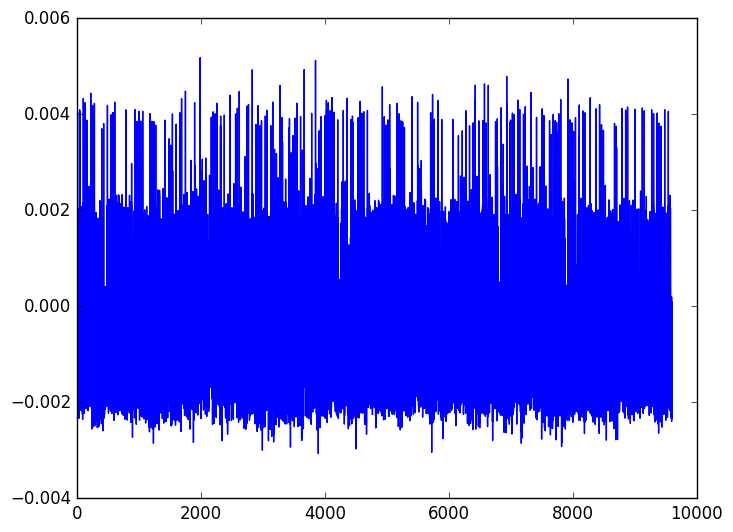

1-element Array{Any,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7f93f6600ad0>

In [23]:
fig = plt.figure()
plt.plot(x.diff_of_means[1][1])


In [25]:
x.diff_of_means[1][1]

9600×1 Array{Float64,2}:
  1.03511e-5 
 -0.000155165
  0.000399298
 -3.01103e-5 
 -0.000462417
 -0.00033993 
 -0.000155426
  0.00021323 
  3.44032e-5 
 -8.25476e-6 
  0.00136656 
 -0.000118104
 -0.00023654 
  ⋮          
 -9.78937e-6 
  0.00203012 
  8.72718e-5 
  7.96389e-5 
  0.00363191 
 -0.000229749
  0.00355395 
 -0.000201404
 -0.000121846
 -0.00039674 
 -2.4012e-5  
 -7.45135e-5 

In [24]:
#DPA on the MSB of the S(pt(xor)subkey) for the first sbox
difference_of_means = []
for subkey in 0:255
    marker = zeros(Int,n_samples)
    for i in 1:n_samples
        pt = aes_first_round[1][i]
        ptval = parse(Int,pt[1:2],16)
        xor_val = ptval$subkey
        sval = aes_sbox[xor_val+1]
        if bin(sval,8)[1] == '1'
            marker[i] = 1
        end
    end
    one_pos = find(marker .== 1)
    zero_pos = find(marker .== 0)
    classone = traces[one_pos,:]
    classzero = traces[zero_pos,:]
    diff = mean(classone,1)' - mean(classzero,1)'
    push!(difference_of_means,diff)
    println("subkey$(subkey) done!")
end

subkey0 done!
subkey1 done!
subkey2 done!
subkey3 done!
subkey4 done!
subkey5 done!
subkey6 done!
subkey7 done!
subkey8 done!
subkey9 done!
subkey10 done!
subkey11 done!
subkey12 done!
subkey13 done!
subkey14 done!
subkey15 done!
subkey16 done!
subkey17 done!
subkey18 done!
subkey19 done!
subkey20 done!
subkey21 done!
subkey22 done!
subkey23 done!
subkey24 done!
subkey25 done!
subkey26 done!
subkey27 done!
subkey28 done!
subkey29 done!
subkey30 done!
subkey31 done!
subkey32 done!
subkey33 done!
subkey34 done!
subkey35 done!
subkey36 done!
subkey37 done!
subkey38 done!
subkey39 done!
subkey40 done!
subkey41 done!
subkey42 done!
subkey43 done!
subkey44 done!
subkey45 done!
subkey46 done!
subkey47 done!
subkey48 done!
subkey49 done!
subkey50 done!
subkey51 done!
subkey52 done!
subkey53 done!
subkey54 done!
subkey55 done!
subkey56 done!
subkey57 done!
subkey58 done!
subkey59 done!
subkey60 done!
subkey61 done!
subkey62 done!
subkey63 done!
subkey64 done!
subkey65 done!
subkey66 done!
subke

In [26]:
difference_of_means[1]

9600×1 Array{Float64,2}:
  3.99703e-6 
 -0.000138903
  9.38149e-6 
  1.40355e-5 
 -0.000177522
 -8.76828e-7 
  1.27394e-5 
 -0.000186522
 -8.49703e-6 
  1.18244e-5 
 -0.000302049
 -4.70344e-6 
 -4.8546e-5  
  ⋮          
 -8.06669e-6 
 -0.000102349
 -5.09047e-6 
 -1.43375e-5 
 -0.00014301 
 -1.26467e-5 
 -0.000280045
 -1.2185e-5  
 -1.60152e-5 
 -0.000117745
 -3.26402e-6 
 -5.15218e-6 

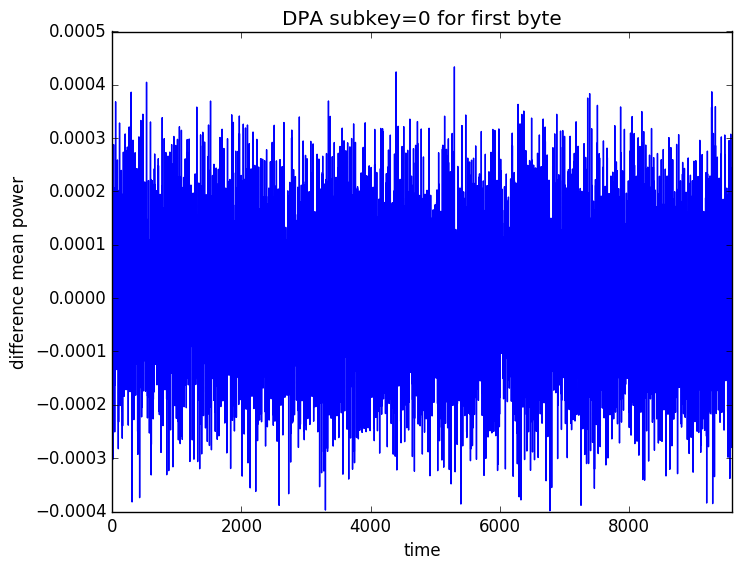

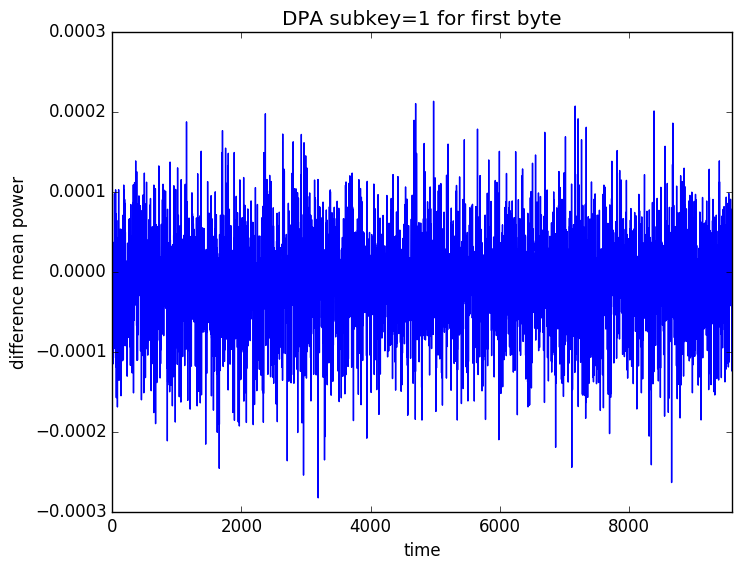

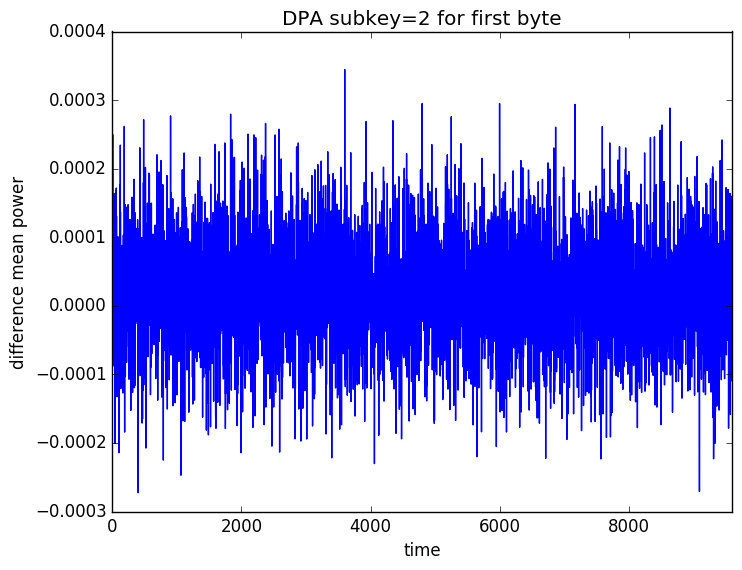

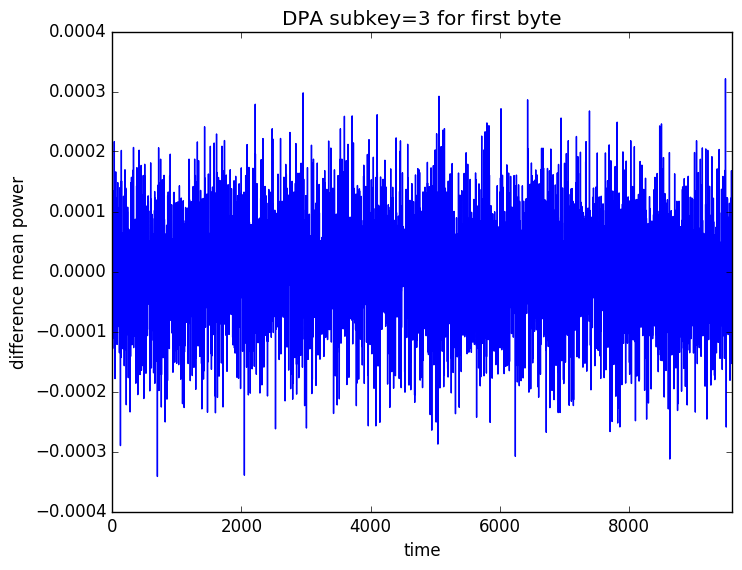

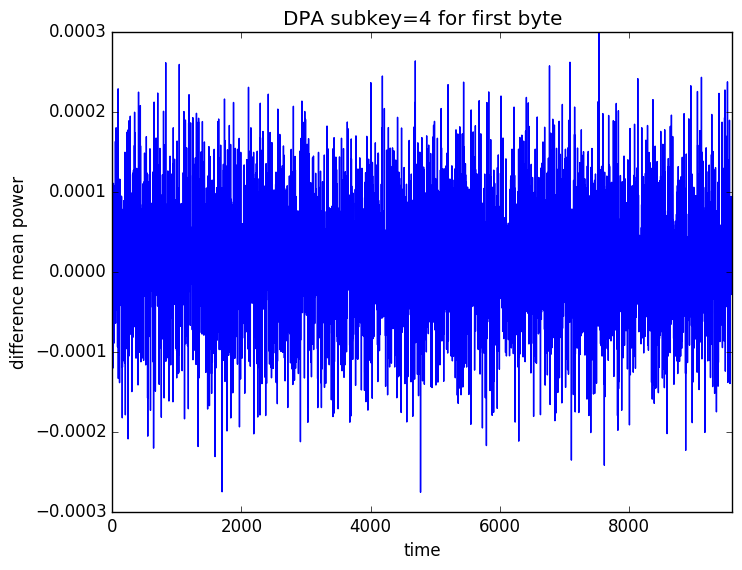

...

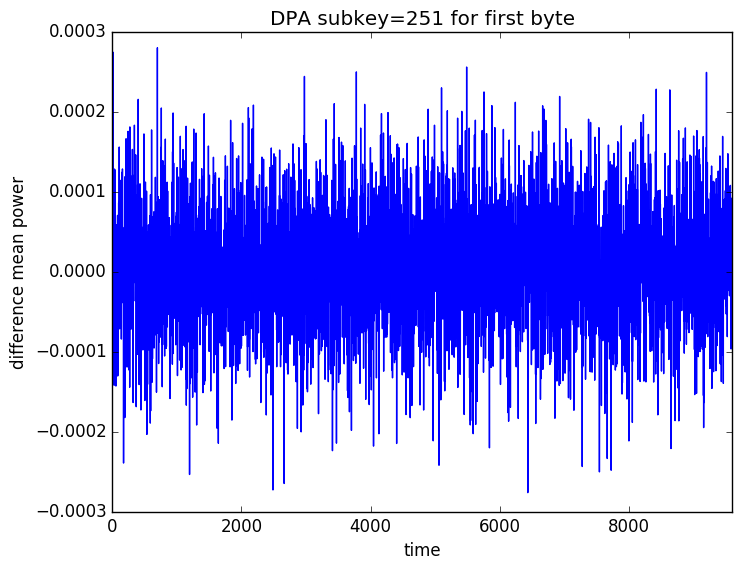

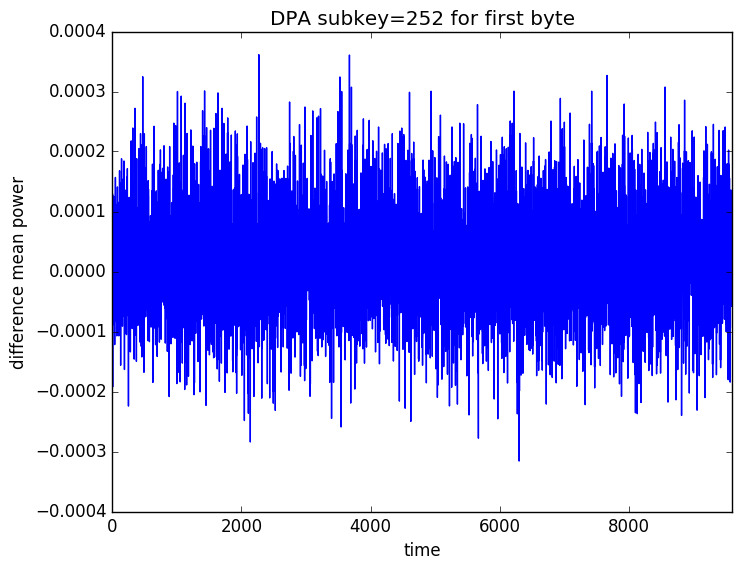

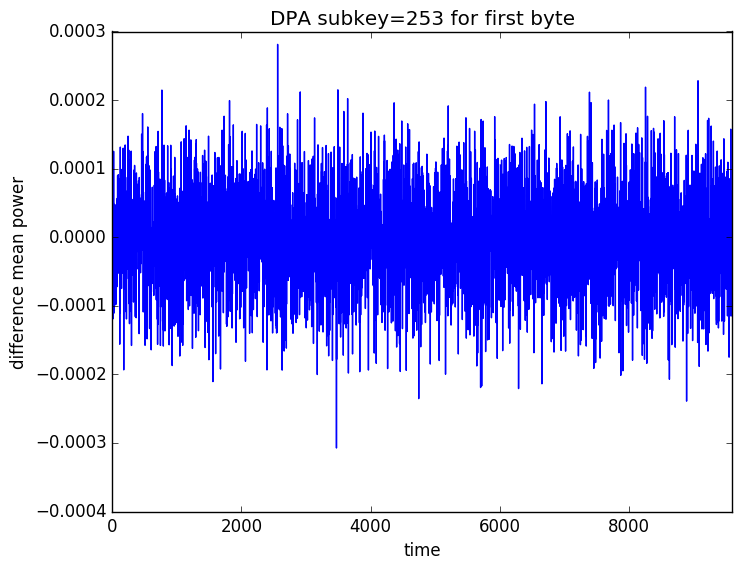

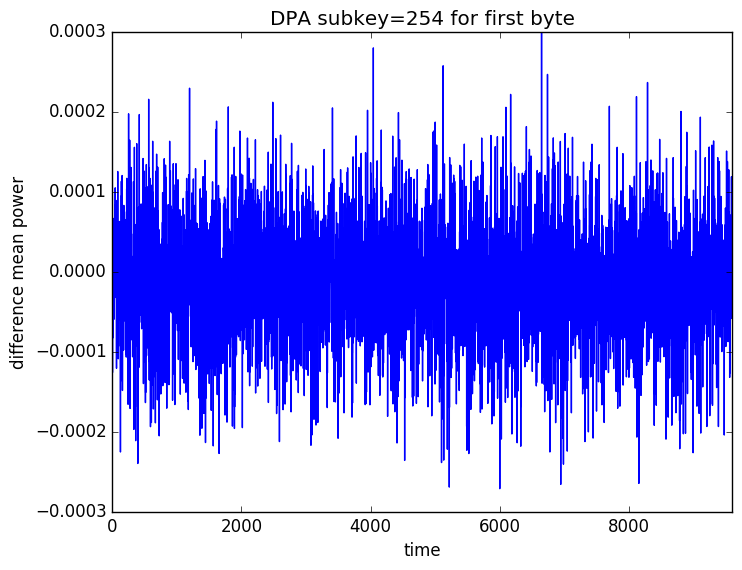

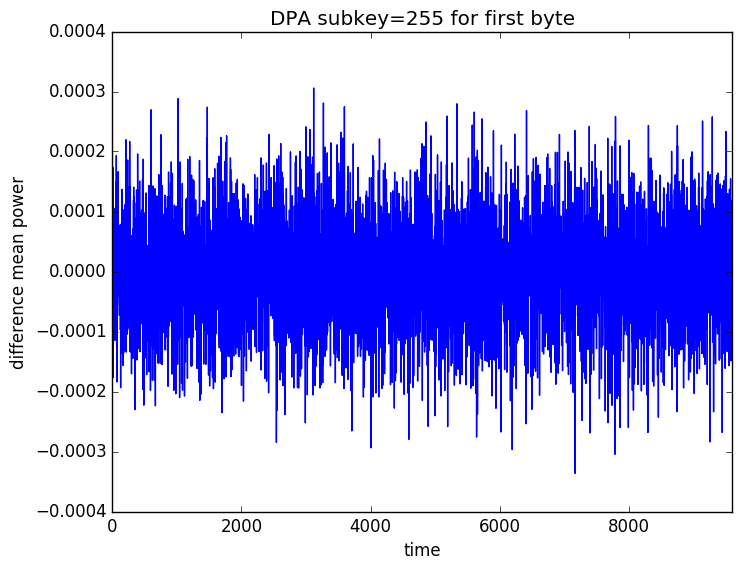

/usr/lib/python2.7/dist-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


In [55]:
#DPA graphs for the first byte (first sbox with different subkeys)
for i in 0:255
    plt.figure()
    plt.plot(difference_of_means[i+1])
    plt.xlim(0,9601)
    xlabel("time")
    ylabel("difference mean power")
    title("DPA subkey=$(i) for first byte")
    plt.savefig("./DPAplots/byte1/subkek$(i).png")
end

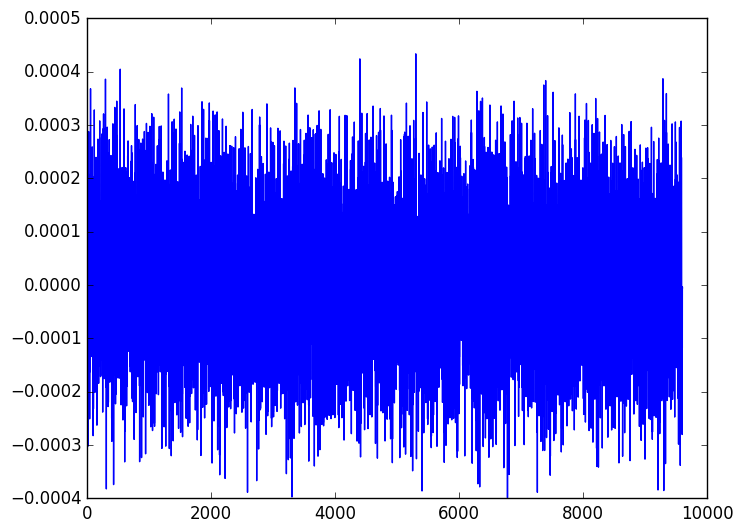

1-element Array{Any,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7f971cbaaed0>

In [34]:
Y =  mean(classone)'-mean(classzero)'
plt.plot(Y)